In [1]:
import glob
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.visualization import ZScaleInterval

In [2]:
def Fits_Array(a):
    """Función para generar un array tridimensional de imágenes, siendo 'a'
    una lista con los pathnames de las imágenes que se quiere estackear"""
    b=np.empty([4096,4096,0])
    for i in range(len(a)):
        x=fits.open(a[i])
        b=np.dstack((b,np.array(x[0].data)))
    return b

In [3]:
def Plots(cube,rows,columns,contr,direc_name,im_name,size_x=30,size_y=30):
    """Función para plotear la imágenes de un cubo, se pueden ajustar tanto el tamaño de las filas y columnas como el tamaño de
    la figura completa, hay que dar valores para los topes del cmap (por default es gray)"""
    fig=plt.figure(figsize=(size_x,size_y))
    for i in range (cube.shape[2]):
        zscale=ZScaleInterval(contrast=contr)
        minv,maxv=zscale.get_limits(cube[:,:,i])
        fig.add_subplot(rows,columns,i+1).imshow(cube[:,:,i],vmin=minv,vmax=maxv,cmap='gray')
    plt.savefig(f"{direc_name}/{im_name}.png",facecolor='white')

In [4]:
def Path_Lists(obj,fotom_filter,exp_time):
    """"Función para generar listas con los nombres de los archivos de cada foto, hay que entregarle strings como
    argumento, usando guión bajo en lugar de espacio, ej:NGC_1316"""
    lights=path_list=glob.glob(f"Light_{obj}_{fotom_filter}_{exp_time}*")
    bias=path_list=glob.glob("Bias_*")
    darks=path_list=glob.glob(f"DARK_{exp_time}_*")
    flats=path_list=glob.glob(f"FLAT_{fotom_filter}_*")
    return lights,bias,darks,flats

In [5]:
def Redux(o,ff,et,dn):
    """o:object,ff=filter,et=exposure time,dn=directory name"""
    l,b,d,f=Path_Lists(o,ff,et)
    #Generamos cubos
    light_cube=Fits_Array(l)
    bias_cube=Fits_Array(b)
    dark_cube=Fits_Array(d)
    flat_cube=Fits_Array(f)
    #Generamos masters
    Master_Bias=np.nanmedian(bias_cube,axis=2)
    Master_Dark=np.nanmedian(dark_cube,axis=2)-Master_Bias
    Dark_Bias=(Master_Bias+Master_Dark)
    Master_Flat=np.mean(flat_cube,axis=2)
    Norm_Master_Flat=(Master_Flat-Dark_Bias)/(np.nanmedian(Master_Flat-Dark_Bias))
    #Reducimos
    reducc=np.empty([4096,4096,0])
    for i in range (light_cube.shape[2]):
        oper=(light_cube[:,:,i]-Dark_Bias)/Norm_Master_Flat
        reducc=np.dstack((reducc,oper))
    prod=np.nanmedian(reducc,axis=2)
    #Plots
    zscale=ZScaleInterval(contrast=0.04)
    minv,maxv=zscale.get_limits(prod)
    plt.figure(figsize = (10,10))
    plt.imshow(prod,vmin=minv,vmax=maxv,cmap="binary_r")
    plt.savefig(f"{dn}/final.png",facecolor='white')
    Plots(light_cube,1,3,0.04,dn,"raw")
    Plots(bias_cube,5,2,0.25,dn,"bias",size_y=80)
    Plots(dark_cube,2,2,0.25,dn,"dark")
    Plots(flat_cube,3,2,0.5,dn,"flat",size_y=50)
    
    return prod

/tmp/ipykernel_7221/1942722298.py:18: RuntimeWarning: invalid value encountered in true_divide
  oper=(light_cube[:,:,i]-Dark_Bias)/Norm_Master_Flat
/home/gabop/anaconda3/lib/python3.9/site-packages/numpy/lib/nanfunctions.py:1113: RuntimeWarning: All-NaN slice encountered
  r, k = function_base._ureduce(a, func=_nanmedian, axis=axis, out=out,


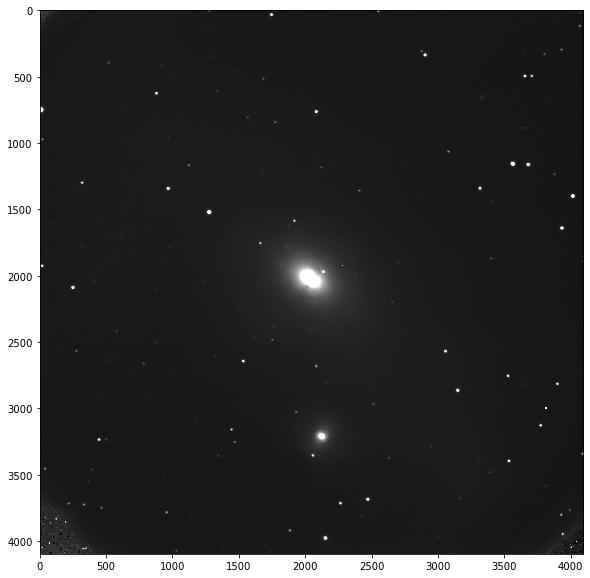

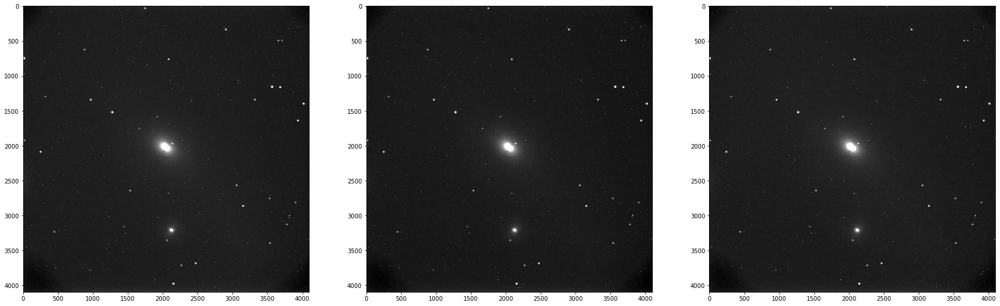

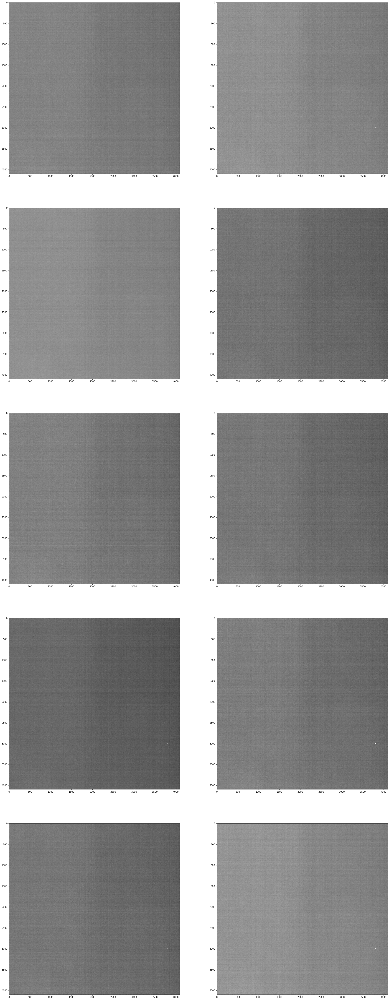

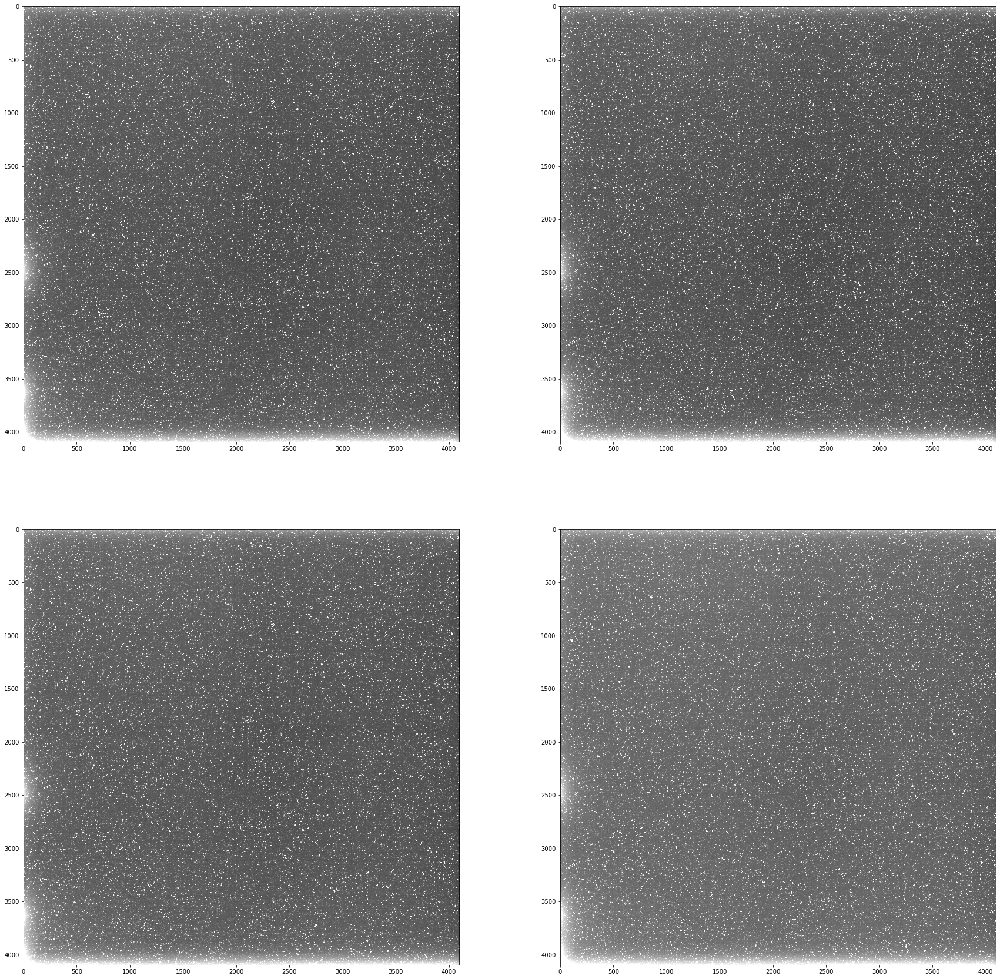

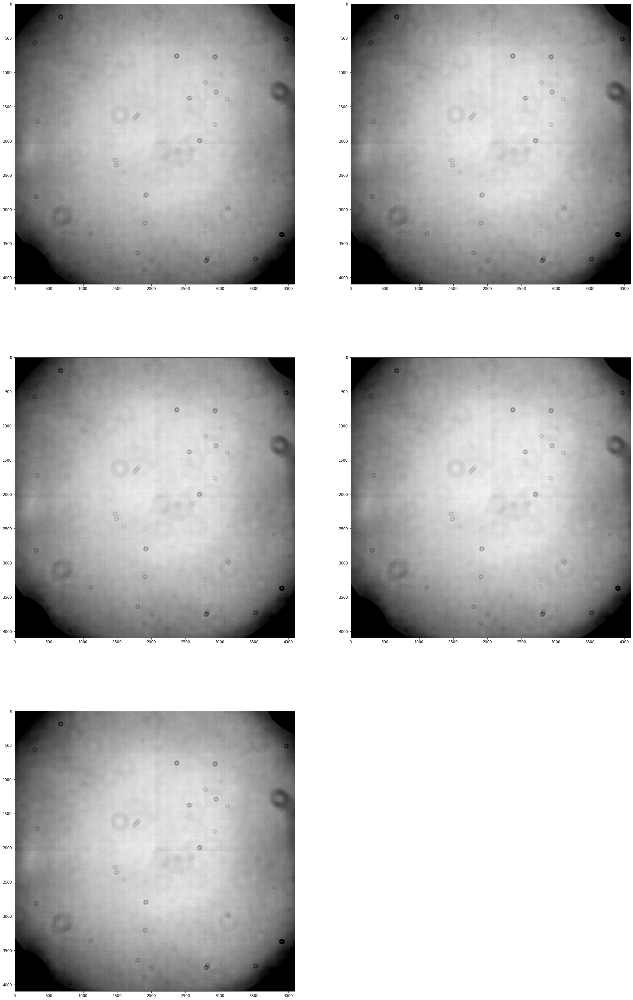

In [6]:
test=Redux("NGC_1316","V","400sec","Images")